In [2]:
import tensorflow as tf

if tf.test.gpu_device_name(): 

    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))

else:
    print("Please install GPU version of TF")

Default GPU Device:/device:GPU:0


In [1]:
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__)
print("TF-Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.test.is_gpu_available())


TF Version:  2.3.1
TF-Hub version:  0.11.0
Eager mode enabled:  True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU available:  True


In [2]:
# @title Define image loading and visualization functions  { display-mode: "form" }

def crop_center(image):
  """Returns a cropped square image."""
  shape = image.shape
  new_shape= min(shape[1], shape[2])
  offset_y = max(shape[1] - shape[2], 0) // 2 # integer division by 2
  offset_x = max(shape[2] - shape[1], 0) // 2
  print(offset_y,offset_x)
  image = tf.image.crop_to_bounding_box(image, offset_y, offset_x, new_shape, new_shape) #
  return image

In [3]:
img = plt.imread('1.jpg').astype(np.float32)[np.newaxis, ...]
print(img.shape)
if img.max() > 1.0:
    img = img / 255.
if len(img.shape) == 3:
    img = tf.stack([img, img, img], axis=-1)
img = crop_center(img)
print(img.shape)
image_size=(384, 384)
img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
img.shape

(1, 2053, 2498, 3)
0 222
(1, 2053, 2053, 3)


TensorShape([1, 384, 384, 3])

In [4]:
# Decorator to wrap a function with a memoizing callable that saves up to the maxsize most recent calls. 
# It can save time when an expensive or I/O bound function is periodically called with the same arguments.
@functools.lru_cache(maxsize=None) 
def load_image(image_url, image_size=(256, 256), preserve_aspect_ratio=True):
  """Loads and preprocesses images."""
  # Cache image file locally.
  image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)
  # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
  img = plt.imread(image_path).astype(np.float32)[np.newaxis, ...]
  if img.max() > 1.0:
    img = img / 255.
  if len(img.shape) == 3:
    img = tf.stack([img, img, img], axis=-1)
  img = crop_center(img)
  img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
  return img

In [5]:
def show_n(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  print('w=',w)
  plt.figure(figsize=(w  * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes) #Grid layout to place subplots in a figure
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()


In [6]:
content_image_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/fd/Golden_Gate_Bridge_from_Battery_Spencer.jpg/640px-Golden_Gate_Bridge_from_Battery_Spencer.jpg'  # @param {type:"string"}
style_image_url = 'https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg'  # @param {type:"string"}
output_image_size = 384  # @param {type:"integer"}


# The content image size can be arbitrary.
content_img_size = (output_image_size, output_image_size)


# The style prediction model was trained with image size 256 and it's the 
# recommended image size for the style image (though, other sizes work as 
# well but will lead to different results).
style_img_size = (256, 256)  # Recommended to keep it at 256.

content_image = load_image(content_image_url, content_img_size)
style_image = load_image(style_image_url, style_img_size)


0 80
0 672


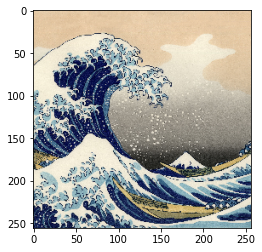

In [7]:
plt.imshow(style_image[0,:,:,:])

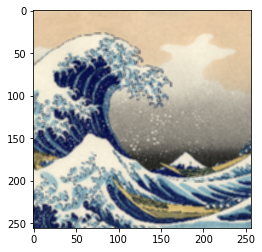

In [8]:
style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')
plt.imshow(style_image[0,:,:,:])

w= 7


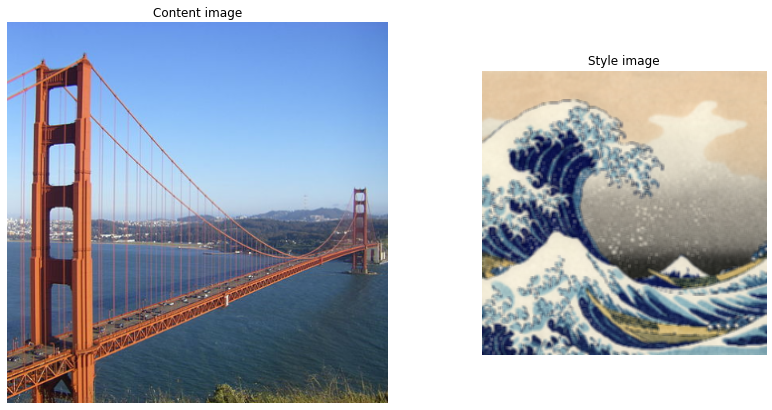

In [9]:
show_n([content_image, style_image], ['Content image', 'Style image'])


In [10]:
help(gridspec.GridSpec)

Help on class GridSpec in module matplotlib.gridspec:

class GridSpec(GridSpecBase)
 |  GridSpec(nrows, ncols, figure=None, left=None, bottom=None, right=None, top=None, wspace=None, hspace=None, width_ratios=None, height_ratios=None)
 |  
 |  A grid layout to place subplots within a figure.
 |  
 |  The location of the grid cells is determined in a similar way to
 |  `~.figure.SubplotParams` using *left*, *right*, *top*, *bottom*, *wspace*
 |  and *hspace*.
 |  
 |  Method resolution order:
 |      GridSpec
 |      GridSpecBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getstate__(self)
 |  
 |  __init__(self, nrows, ncols, figure=None, left=None, bottom=None, right=None, top=None, wspace=None, hspace=None, width_ratios=None, height_ratios=None)
 |      Parameters
 |      ----------
 |      nrows, ncols : int
 |          The number of rows and columns of the grid.
 |      
 |      figure : `~.figure.Figure`, optional
 |          Only used for constrained layout 

In [11]:
# Load TF-Hub module.

hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)


In [12]:
outputs = hub_module(content_image, style_image)
print(len(outputs))
stylized_image = outputs[0]


1


w= 7


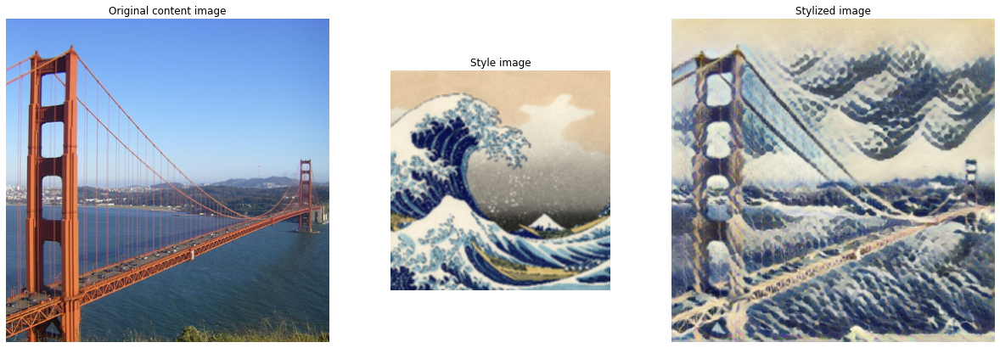

In [13]:
show_n([content_image, style_image, stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])

In [14]:
content_urls = dict(
  sea_turtle='https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg',
  tuebingen='https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg',
  grace_hopper='https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg',
  )
style_urls = dict(
  kanagawa_great_wave='https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg',
  kandinsky_composition_7='https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg',
  hubble_pillars_of_creation='https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',
  van_gogh_starry_night='https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
  turner_nantes='https://upload.wikimedia.org/wikipedia/commons/b/b7/JMW_Turner_-_Nantes_from_the_Ile_Feydeau.jpg',
  munch_scream='https://upload.wikimedia.org/wikipedia/commons/c/c5/Edvard_Munch%2C_1893%2C_The_Scream%2C_oil%2C_tempera_and_pastel_on_cardboard%2C_91_x_73_cm%2C_National_Gallery_of_Norway.jpg',
  picasso_demoiselles_avignon='https://upload.wikimedia.org/wikipedia/en/4/4c/Les_Demoiselles_d%27Avignon.jpg',
  picasso_violin='https://upload.wikimedia.org/wikipedia/en/3/3c/Pablo_Picasso%2C_1911-12%2C_Violon_%28Violin%29%2C_oil_on_canvas%2C_Kr%C3%B6ller-M%C3%BCller_Museum%2C_Otterlo%2C_Netherlands.jpg',
  picasso_bottle_of_rum='https://upload.wikimedia.org/wikipedia/en/7/7f/Pablo_Picasso%2C_1911%2C_Still_Life_with_a_Bottle_of_Rum%2C_oil_on_canvas%2C_61.3_x_50.5_cm%2C_Metropolitan_Museum_of_Art%2C_New_York.jpg',
  fire='https://upload.wikimedia.org/wikipedia/commons/3/36/Large_bonfire.jpg',
  derkovits_woman_head='https://upload.wikimedia.org/wikipedia/commons/0/0d/Derkovits_Gyula_Woman_head_1922.jpg',
  amadeo_style_life='https://upload.wikimedia.org/wikipedia/commons/8/8e/Untitled_%28Still_life%29_%281913%29_-_Amadeo_Souza-Cardoso_%281887-1918%29_%2817385824283%29.jpg',
  derkovtis_talig='https://upload.wikimedia.org/wikipedia/commons/3/37/Derkovits_Gyula_Talig%C3%A1s_1920.jpg',
  amadeo_cardoso='https://upload.wikimedia.org/wikipedia/commons/7/7d/Amadeo_de_Souza-Cardoso%2C_1915_-_Landscape_with_black_figure.jpg'
)


In [15]:
help(load_image)

Help on _lru_cache_wrapper in module __main__:

load_image(image_url, image_size=(256, 256), preserve_aspect_ratio=True)
    Loads and preprocesses images.



In [16]:
content_image_size = 384
style_image_size = 256
content_images = {k: load_image(v) for k,v in content_urls.items()}
style_images = {k: load_image(v) for k,v in style_urls.items()}


3178496/3170828 [==============================] - 1s 0us/step
0 421
409600/406531 [==============================] - 0s 0us/step
0 128
65536/61306 [================================] - 0s 1us/step
44 0
0 672
196608/195196 [==============================] - 0s 1us/step
0 171
46931968/46930988 [==============================] - 6s 0us/step
145 0
401408/396423 [==============================] - 0s 1us/step
0 106
147456/144340 [==============================] - 0s 1us/step
0 143
11403264/11403121 [==============================] - 3s 0us/step
388 0
2908160/2905099 [==============================] - 1s 0us/step
80 0
1236992/1234199 [==============================] - 0s 0us/step
119 0
122880/120288 [==============================] - 0s 1us/step
50 0
139264/131604 [===============================] - 0s 1us/step
0 133
32768/32390 [==============================] - 0s 1us/step
55 0
1916928/1914618 [==============================] - 0s 0us/step
0 326
40960/40620 [==============================] 

In [17]:
style_images = {k: tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME') for k, style_image in style_images.items()}


In [19]:
style_images

{'kanagawa_great_wave': <tf.Tensor: shape=(1, 256, 256, 3), dtype=float32, numpy=
 array([[[[0.90983367, 0.82220733, 0.6953461 ],
          [0.9100488 , 0.81807584, 0.69514894],
          [0.905598  , 0.80969065, 0.6868021 ],
          ...,
          [0.90713215, 0.79794353, 0.6626111 ],
          [0.9039845 , 0.7944355 , 0.6549594 ],
          [0.9078411 , 0.7968495 , 0.6555773 ]],
 
         [[0.9070384 , 0.81311727, 0.6847523 ],
          [0.906459  , 0.81058145, 0.6820071 ],
          [0.9041409 , 0.8062156 , 0.67766684],
          ...,
          [0.9088018 , 0.7992345 , 0.6631302 ],
          [0.90410167, 0.7947299 , 0.65368444],
          [0.90563387, 0.7937309 , 0.65183705]],
 
         [[0.90472776, 0.80016536, 0.6650551 ],
          [0.9013394 , 0.796337  , 0.6609477 ],
          [0.89869225, 0.7923741 , 0.6577337 ],
          ...,
          [0.8990029 , 0.7856124 , 0.6521489 ],
          [0.89266026, 0.78057694, 0.6405775 ],
          [0.89571136, 0.78067875, 0.6408094 ]],
 


In [21]:
nst = {}
for k,v in content_images.items():
    for x,z in style_images.items():
        outputs = hub_module(v, z)
        nst[k+' and ' + x] = outputs[0]


In [24]:
help(show_n)

Help on function show_n in module __main__:

show_n(images, titles=('',))



w= 4


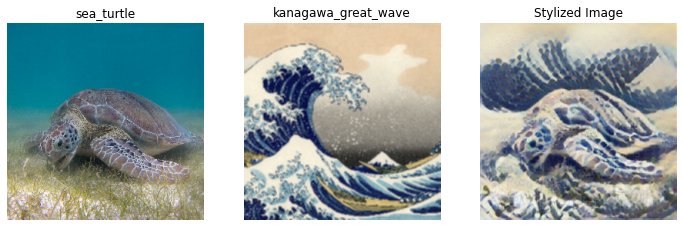

w= 4


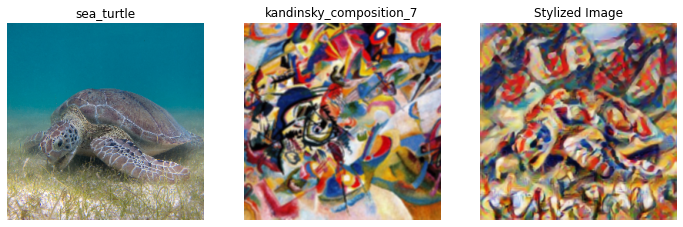

w= 4


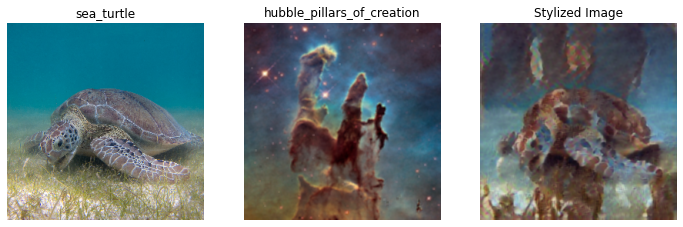

w= 4


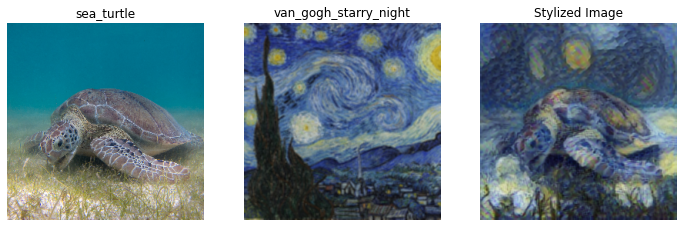

w= 4


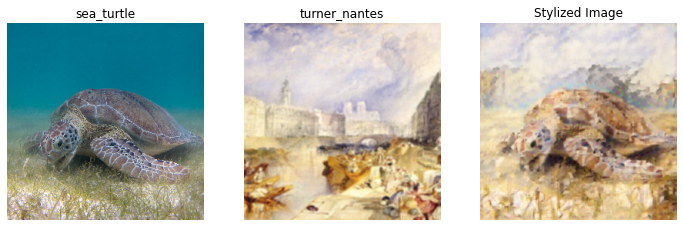

w= 4


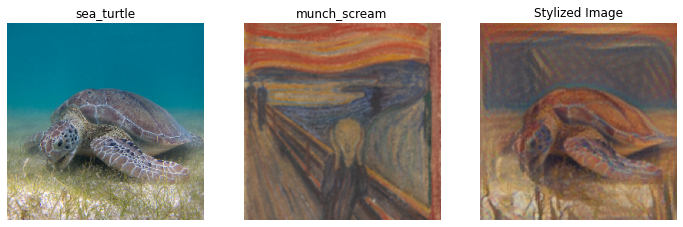

w= 4


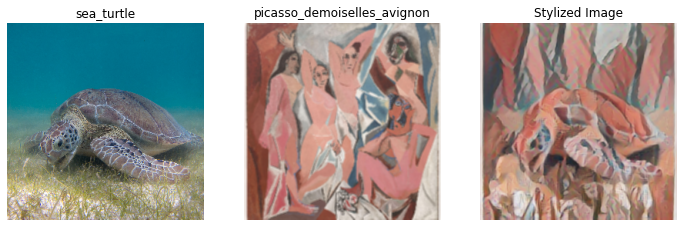

w= 4


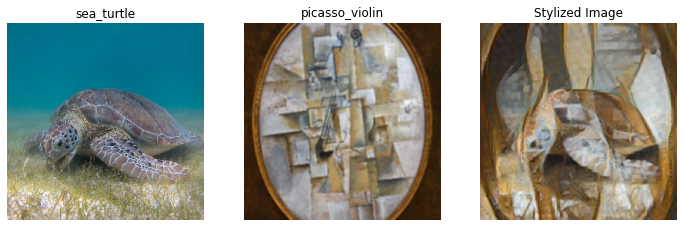

w= 4


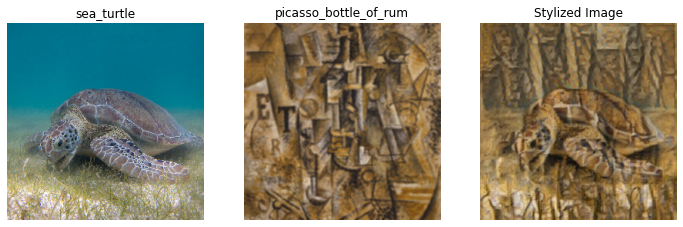

w= 4


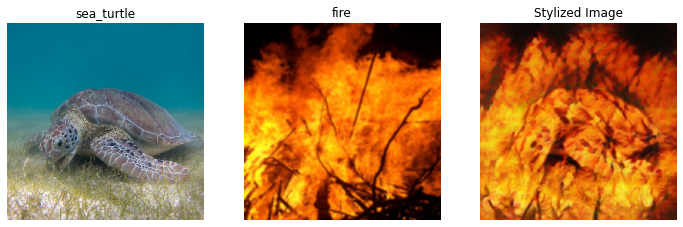

w= 4


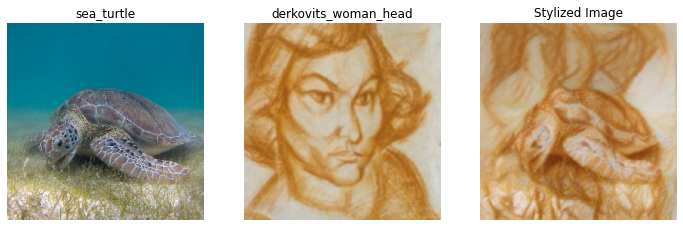

w= 4


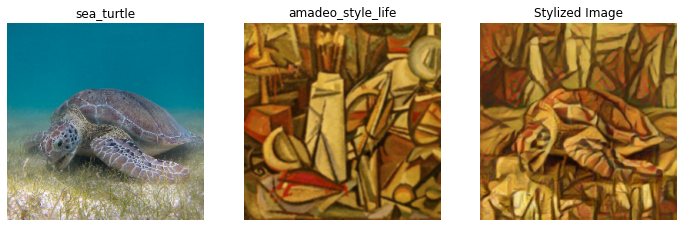

w= 4


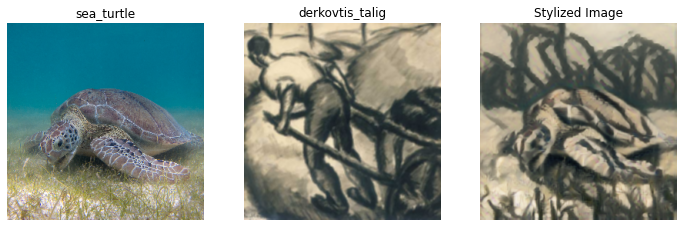

w= 4


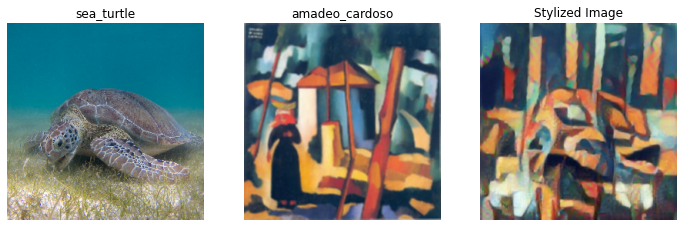

w= 4


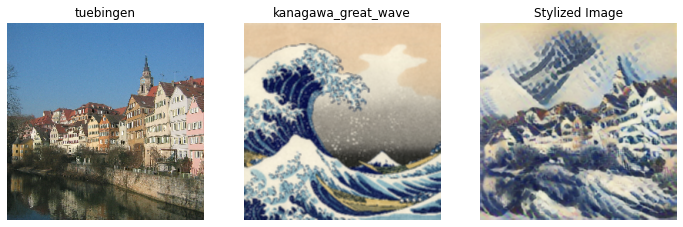

w= 4


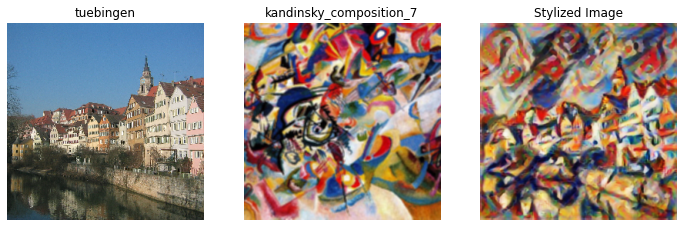

w= 4


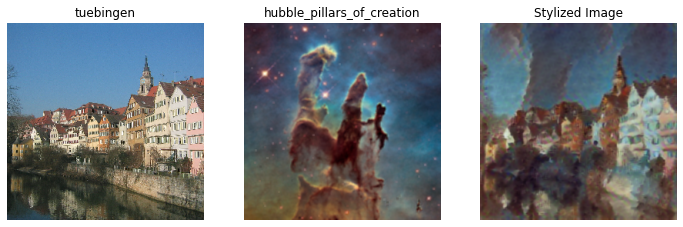

w= 4


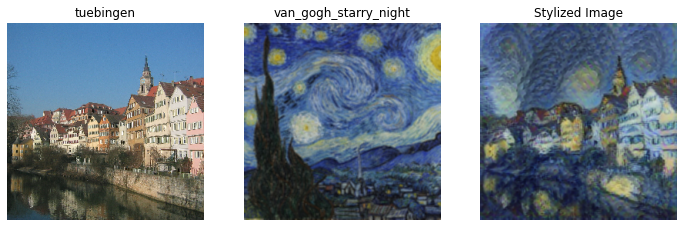

w= 4


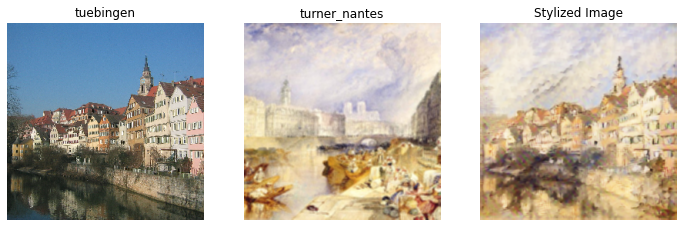

w= 4


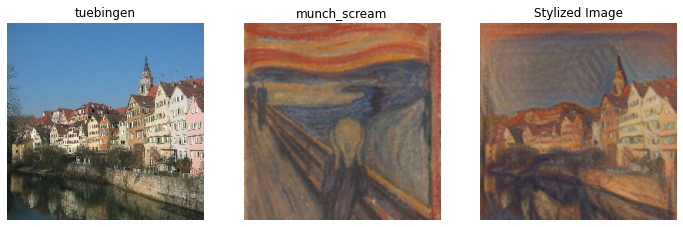

w= 4


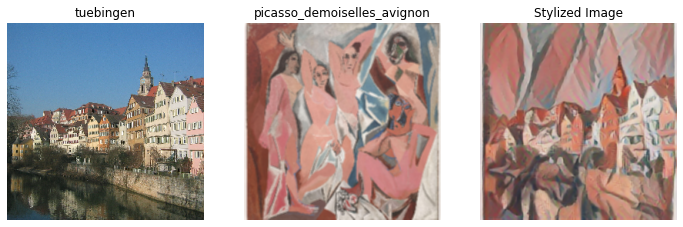

w= 4


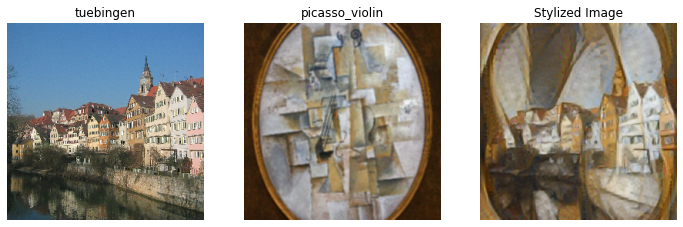

w= 4


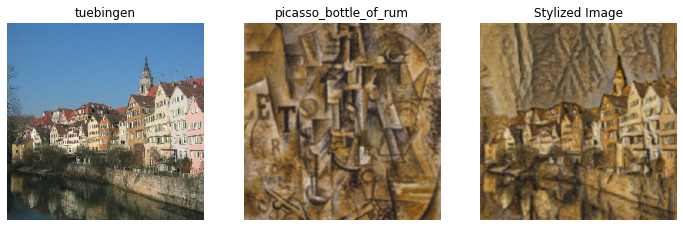

w= 4


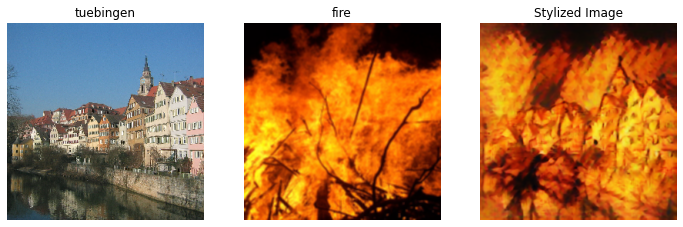

w= 4


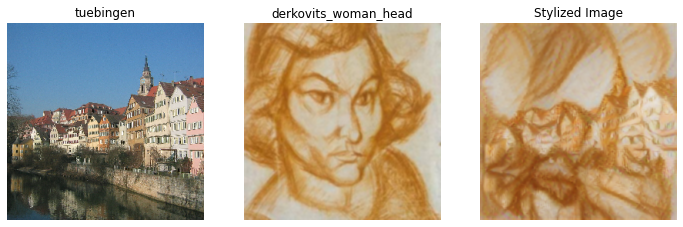

w= 4


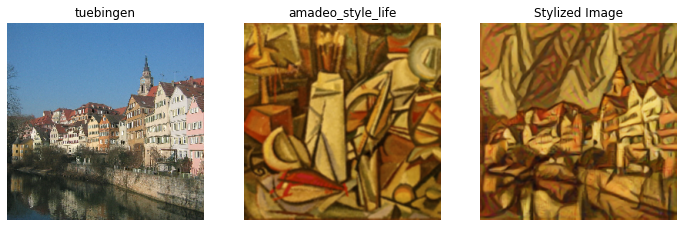

w= 4


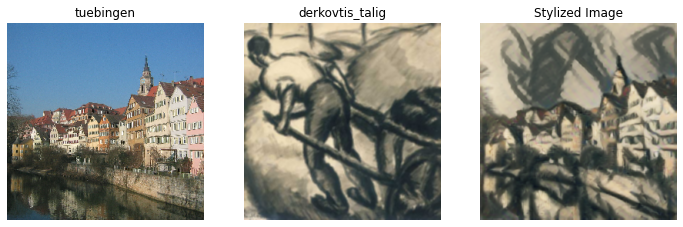

w= 4


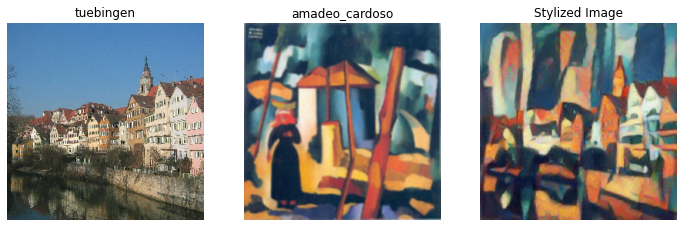

w= 4


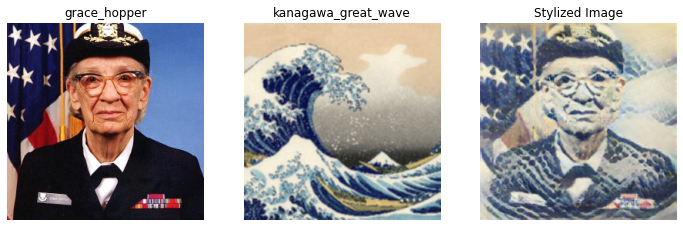

w= 4


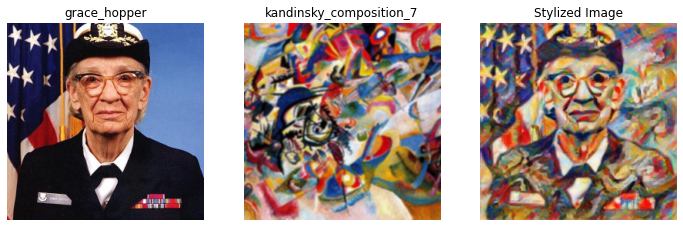

w= 4


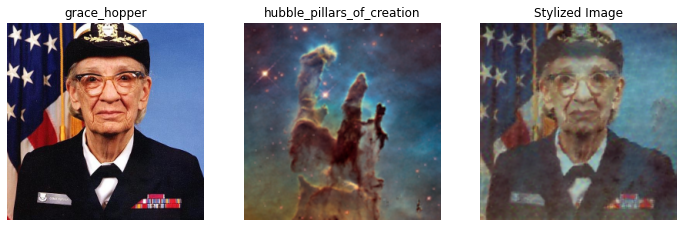

w= 4


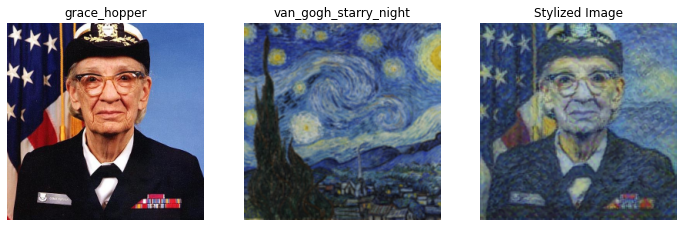

w= 4


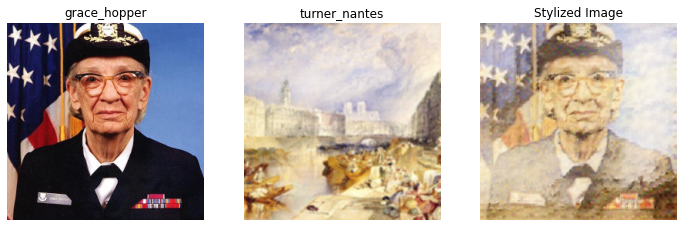

w= 4


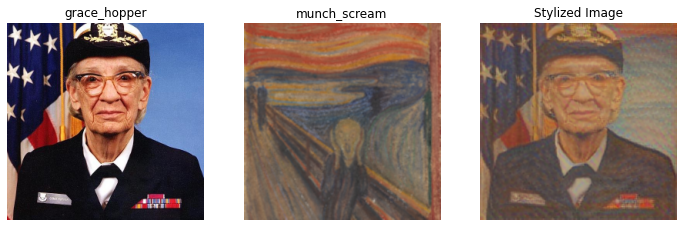

w= 4


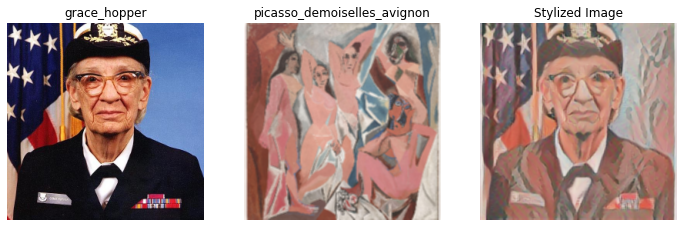

w= 4


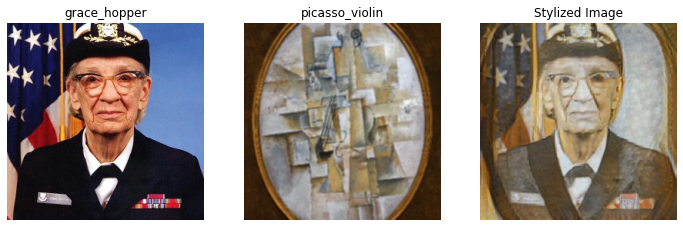

w= 4


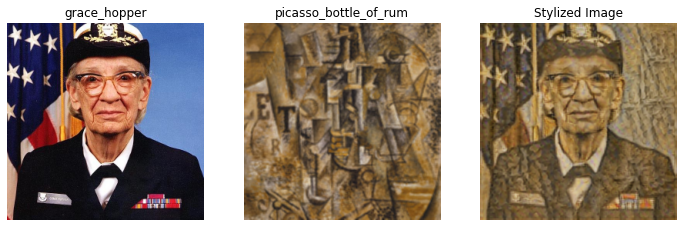

w= 4


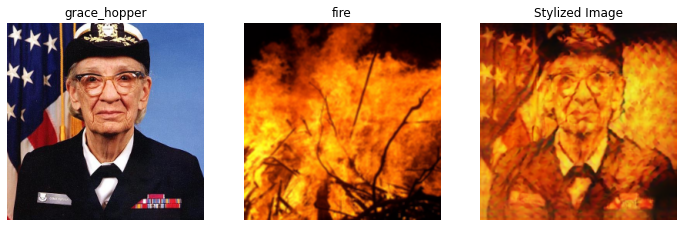

w= 4


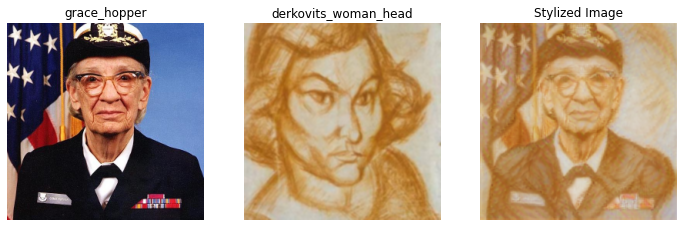

w= 4


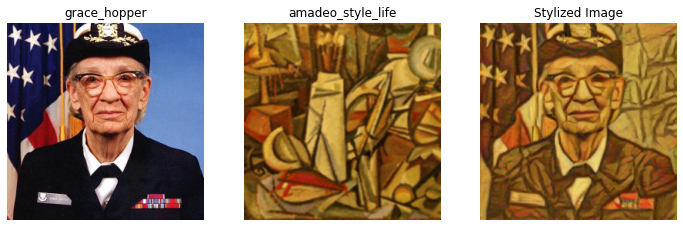

w= 4


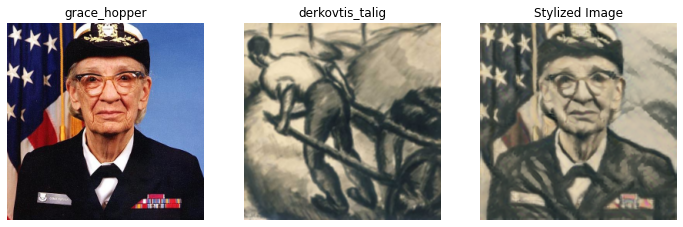

w= 4


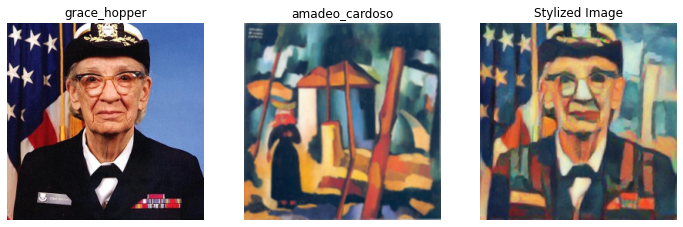

In [25]:
for k,v in content_images.items():
    for x,z in style_images.items():
        outputs = hub_module(v, z)
        show_n([v, z, outputs[0]], titles=[k, x,'Stylized Image'])

(1, 1500, 1879, 3)
0 189


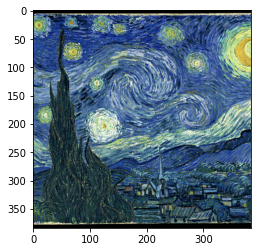

In [31]:
image_url = 'https://upload.wikimedia.org/wikipedia/commons/6/66/VanGogh-starry_night_ballance1.jpg'
image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)
# Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
img = plt.imread(image_path).astype(np.float32)[np.newaxis, ...]
print(img.shape)
if img.max() > 1.0:
    img = img / 255.
if len(img.shape) == 3:
    img = tf.stack([img, img, img], axis=-1)
img = crop_center(img)
img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
plt.imshow(img[0,:,:,:])